In [23]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import seaborn as sns


In [24]:
X = np.load('x.npy')
y = np.load('y.npy')

print(X.shape)
print(y.shape)

(177, 5, 240, 320, 1)
(177,)


In [25]:
label = y
label

array([0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 1.,
       1., 0., 1., 0., 1., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 2.,
       2., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2.,
       2., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 2., 2., 2., 0., 2., 1., 1., 1., 1., 1., 2., 1., 2.,
       1., 0., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
       2., 2., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0.,
       0., 0., 0., 0., 2., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       2., 0., 1., 0., 0., 0., 1.])

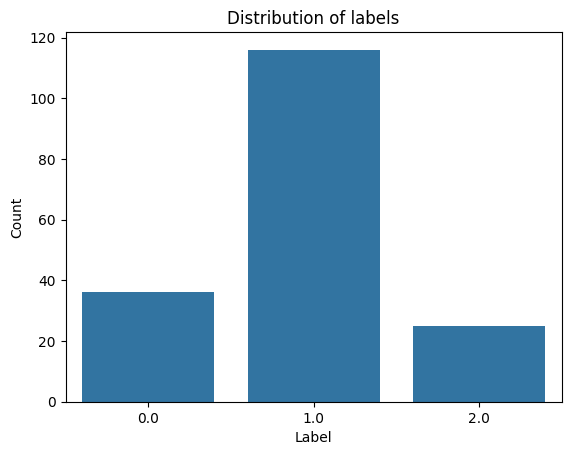

In [26]:
sns.countplot(x=label)
plt.title('Distribution of labels')
plt.xlabel('Label')
plt.ylabel('Count')
plt.show()

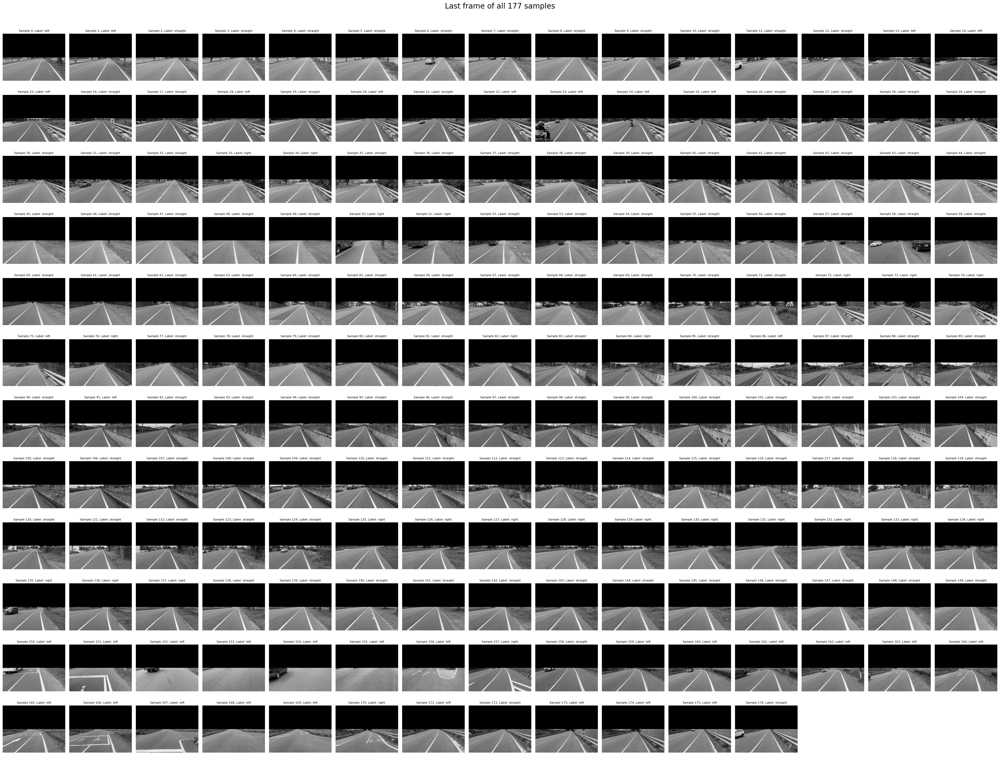

In [27]:
# plot some of the graphs in X
num_samples = len(X)
cols = 15 # Adjust number of columns as desired
rows = int(np.ceil(num_samples / cols))

# Adjust figsize based on the number of rows and columns to make plots visible
fig, axes = plt.subplots(rows, cols, figsize=(cols * 2.5, rows * 2.5)) # Increased figsize per subplot
fig.suptitle(f"Last frame of all {num_samples} samples", fontsize=20) # Updated title

label_mapping = {0: "left", 1: "straight", 2: "right"}

# Flatten axes array for easy iteration, handle cases with single row/column
if rows == 1 and cols == 1:
    axes_flat = [axes]
elif rows == 1 or cols == 1:
    axes_flat = axes
else:
    axes_flat = axes.flatten()


for i, ax in enumerate(axes_flat):
    if i < num_samples:  # Iterate through all samples
        frame_to_show = X[i, 4].squeeze()
        ax.imshow(frame_to_show, cmap='gray')
        # Reduced font size for potentially many plots
        ax.set_title(f"Sample {i}, Label: {label_mapping[label[i]]}", fontsize=8)
        ax.axis('off')
    else:
        ax.axis('off') # Hide axes for empty subplots if grid is larger than num_samples

plt.tight_layout(rect=[0, 0.03, 1, 0.97]) # Adjust layout
plt.show()

Found 25 samples with label 'right'.


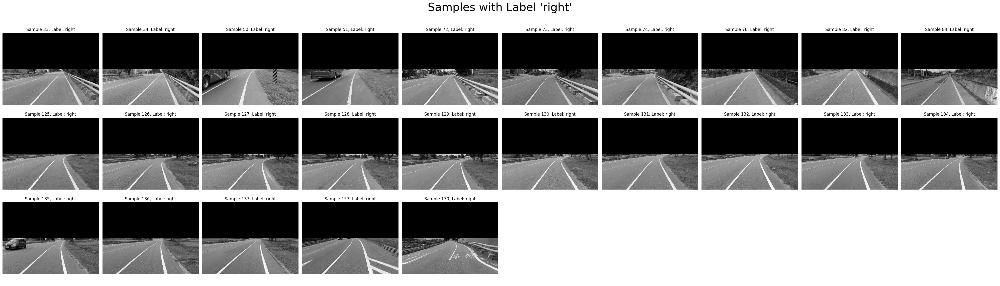

In [28]:
right_indices = np.where(label == 2)[0]
num_right_samples = len(right_indices)

print(f"Found {num_right_samples} samples with label 'right'.")

# Determine grid size for plotting
cols = 10 # Number of columns in the plot grid
rows = int(np.ceil(num_right_samples / cols)) # Calculate required rows

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4)) # Adjust figsize as needed
fig.suptitle("Samples with Label 'right'", fontsize=32)

# Flatten axes array for easy iteration, handle case where there's only one row/column
if rows == 1 and cols == 1:
    axes_flat = [axes]
elif rows == 1 or cols == 1:
     axes_flat = axes
else:
    axes_flat = axes.flatten()


for i, idx in enumerate(right_indices):
    if i < len(axes_flat): # Ensure we don't plot more images than subplots
        ax = axes_flat[i]
        frame_to_show = X[idx, 4].squeeze()  # Get the last frame of the sequence
        ax.imshow(frame_to_show, cmap='gray')
        ax.set_title(f"Sample {idx}, Label: right", fontsize=12) # Show original index
        ax.axis('off')

# Hide any unused subplots
for j in range(i + 1, len(axes_flat)):
    axes_flat[j].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

Found 36 samples with label 'left'.


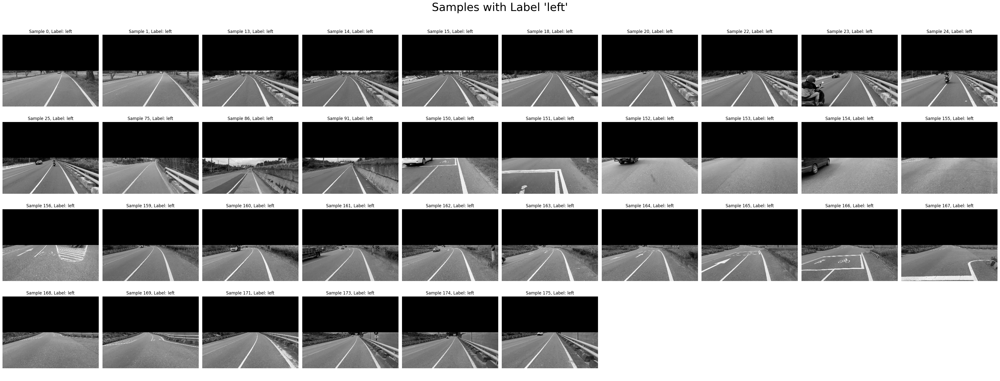

In [29]:
# Find indices where the label is 'left' (0)
left_indices = np.where(label == 0)[0]
num_left_samples = len(left_indices)

print(f"Found {num_left_samples} samples with label 'left'.")

# Determine grid size for plotting
cols = 10 # Number of columns in the plot grid
# Calculate required rows, ensuring at least 1 row even if num_left_samples is 0
rows = int(np.ceil(num_left_samples / cols)) if num_left_samples > 0 else 1

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4)) # Adjust figsize as needed
fig.suptitle("Samples with Label 'left'", fontsize=32)

# Flatten axes array for easy iteration, handle cases with single row/column or no samples
if num_left_samples == 0:
    axes_flat = [] # No axes to plot on
elif rows == 1 and cols == 1:
    axes_flat = [axes]
elif rows == 1 or cols == 1:
     axes_flat = axes.flatten() # Use flatten() for consistency even with 1 row/col > 1
else:
    axes_flat = axes.flatten()

last_plotted_index = -1
for i, idx in enumerate(left_indices):
    if i < len(axes_flat): # Ensure we don't plot more images than subplots
        ax = axes_flat[i]
        # Assuming X shape is (num_samples, sequence_length, height, width, channels)
        # and we want the last frame [:, 4, :, :, :]
        frame_to_show = X[idx, 4].squeeze()  # Get the last frame of the sequence
        ax.imshow(frame_to_show, cmap='gray')
        ax.set_title(f"Sample {idx}, Label: left", fontsize=12) # Show original index
        ax.axis('off')
        last_plotted_index = i

# Hide any unused subplots
for j in range(last_plotted_index + 1, len(axes_flat)):
    axes_flat[j].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.97]) # Adjust layout to prevent title overlap
plt.show()